# **Multiple Imputation, RobustScaler, Autoencoder for dimensionality reduction, and XGBoost**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
import warnings
warnings.filterwarnings('ignore')

In [2]:
from sklearn.model_selection import train_test_split
from keras.models import Sequential, Model
from keras.layers import Activation, Dense, Dropout, Input

# LOADING AND EXPLORING THE DATASET

In [3]:
df = pd.read_excel('salesworkload.xlsx', index_col=None, skiprows=1)

In [4]:
df.head()

,MonthYear,Time index,Country,StoreID,City,Dept_ID,Dept. Name,HoursOwn,HoursLease,Sales units,Turnover,Customer,Area (m2),Opening hours
0,10.2016,1.0,United Kingdom,88253.0,London (I),1.0,Dry,3184.76,0.0,398560.0,1226244.0,NaN,953.04,Type A
1,10.2016,1.0,United Kingdom,88253.0,London (I),2.0,Frozen,1582.94,0.0,82725.0,387810.0,NaN,720.48,Type A
2,10.2016,1.0,United Kingdom,88253.0,London (I),3.0,other,47.205,0.0,438400.0,654657.0,NaN,966.72,Type A
3,10.2016,1.0,United Kingdom,88253.0,London (I),4.0,Fish,1623.85,0.0,309425.0,499434.0,NaN,1053.36,Type A
4,10.2016,1.0,United Kingdom,88253.0,London (I),5.0,Fruits & Vegetables,1759.17,0.0,165515.0,329397.0,NaN,1053.36,Type A


# Data Type Modification

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7658 entries, 0 to 7657
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MonthYear      7658 non-null   object 
 1   Time index     7650 non-null   float64
 2   Country        7650 non-null   object 
 3   StoreID        7650 non-null   float64
 4   City           7650 non-null   object 
 5   Dept_ID        7650 non-null   float64
 6   Dept. Name     7650 non-null   object 
 7   HoursOwn       7650 non-null   object 
 8   HoursLease     7650 non-null   float64
 9   Sales units    7650 non-null   float64
 10  Turnover       7650 non-null   float64
 11  Customer       0 non-null      float64
 12  Area (m2)      7650 non-null   object 
 13  Opening hours  7650 non-null   object 
dtypes: float64(7), object(7)
memory usage: 837.7+ KB


* **MonthYear:** Date in month and year 
* **Time Index:** The period at which the total sales occur
* **Country:** Name of country of the retail industry
* **StoreID:** The given id for specific store
* **City:** Name of city of the retail industry
* **Dept_ID:** The given id for the sales department
* **Dept. Name:** Name of the sales department
* **HoursOwn:** Total hours worked
* **HoursLease:** Total hours of operation rented
* **Sales units:** Total amount of sales
* **Turnover:** The rate at which goods are sold and replaced in a shop.
* **Customer:** The recipient of a good, service, product or an idea - obtained from a seller, vendor, or supplier
* **Area (m2):** Total working are of the retail industry
* **Opening hours:** normal business hours

variables like 'Time index', 'Country', 'StoreID', 'City', 'Dept_ID','Dept. Name', 'Opening hours' have to be categorical and HoursOwn, HoursLease, Sales units, Turnover, Area (m2) have to be numerical types, so data type conversion is required. In addition, the MonthYear should be of type datetime, so it needs to be converted. 

In [6]:
HoursOwn_notnum = df[['HoursOwn']].applymap(np.isreal).values
df[~HoursOwn_notnum][['Dept. Name', 'HoursOwn']]

,Dept. Name,HoursOwn
2966,Meat,?
5889,Frozen,?


In [7]:
# Calculate the mean of HoursOwn for the specified department and without the cells containing a question mark
imp_dept_x = df.loc[(df['Dept. Name'] == 'Meat') & (df['HoursOwn'] != '?')]['HoursOwn'].mean()
imp_dept_y = df.loc[(df['Dept. Name'] == 'Frozen') & (df['HoursOwn'] != '?')]['HoursOwn'].mean()

# Replace the question marks
df.loc[(df['Dept. Name'] == 'Meat') & (df['HoursOwn'] == '?'), ['HoursOwn']] = imp_dept_x
df.loc[(df['Dept. Name'] == 'Frozen') & (df['HoursOwn'] == '?'), ['HoursOwn']] = imp_dept_y

# Give an information about the new values
print('Department Meat: ' + str(imp_dept_x))
print('Department Frozen: ' + str(imp_dept_y))

# convert column now to numeric
df['HoursOwn'] = pd.to_numeric(df['HoursOwn'])

Department Meat: 10018.232692650332
Department Frozen: 2425.853385300666


In [8]:
Area_notnum = df[['Area (m2)']].applymap(np.isreal).values
df[~Area_notnum][['Dept. Name', 'Area (m2)']]

,Dept. Name,Area (m2)
6808,Dry,#NV
6809,Frozen,#NV
6810,other,#NV
6811,Fish,#NV
6812,Fruits & Vegetables,#NV
...,...,...
7653,Checkout,#NV
7654,Customer Services,#NV
7655,Delivery,#NV
7656,others,#NV


In [9]:
# Calculate the mean of Area for the specified department and without the cells containing a question mark
imp_dept = df.loc[(df['Area (m2)'] != '#NV')]['Area (m2)'].mean()

# Replace the question marks
df.loc[(df['Area (m2)'] == '#NV'), ['Area (m2)']] = imp_dept

# Give an information about the new values
print('mean area: ' + str(imp_dept))

# convert column now to numeric
df['Area (m2)'] = pd.to_numeric(df['Area (m2)'])   

mean area: 7557.276935294114


In [10]:
from datetime import datetime

In [11]:
#dConverting MonthYear to pandas datetime
df['MonthYear'] = pd.to_datetime(df['MonthYear'],format='%m.%Y', errors='coerce')
# .dt.to_period('m')

In [12]:
errors = df.loc[df['MonthYear'].isnull()]
errors

,MonthYear,Time index,Country,StoreID,City,Dept_ID,Dept. Name,HoursOwn,HoursLease,Sales units,Turnover,Customer,Area (m2),Opening hours
850,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1701,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2552,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3403,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4254,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5105,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5956,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6807,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df['MonthYear'][errors.index]

850    NaT
1701   NaT
2552   NaT
3403   NaT
4254   NaT
5105   NaT
5956   NaT
6807   NaT
Name: MonthYear, dtype: datetime64[ns]

In [14]:
df['MonthYear'][errors.index].fillna(df['MonthYear'][errors.index-1], inplace=True)
# data['date'] = pd.to_numeric(pd.to_datetime(data['date']))

In [15]:
df['month'] = df.MonthYear.dt.month
df['month'].unique()

array([10., nan, 11., 12.,  1.,  2.,  3.,  4.,  5.,  6.])

In [16]:
df.dtypes

MonthYear        datetime64[ns]
Time index              float64
Country                  object
StoreID                 float64
City                     object
Dept_ID                 float64
Dept. Name               object
HoursOwn                float64
HoursLease              float64
Sales units             float64
Turnover                float64
Customer                float64
Area (m2)               float64
Opening hours            object
month                   float64
dtype: object

# Column Removal and Renaming

In [17]:
df.columns

Index(['MonthYear', 'Time index', 'Country', 'StoreID', 'City', 'Dept_ID',
       'Dept. Name', 'HoursOwn', 'HoursLease', 'Sales units', 'Turnover',
       'Customer', 'Area (m2)', 'Opening hours', 'month'],
      dtype='object')

In [18]:
df = df.rename(columns = {'Time index': 'TimeIndex', 'Dept_ID': 'DeptID',
                                  'Dept. Name': 'DeptName',
                                  'Sales units': 'SalesUnits',
                                  'Area (m2)': 'Area','Opening hours': 'OpeningHours'})

In [19]:
df['StoreID'].value_counts().value_counts()

153    50
Name: StoreID, dtype: int64

In [20]:
df['City'].value_counts().value_counts()

153    50
Name: City, dtype: int64

In [21]:
df['DeptID'].value_counts().value_counts()

450    17
Name: DeptID, dtype: int64

In [22]:
df['DeptName'].value_counts().value_counts()

450    17
Name: DeptName, dtype: int64

In [23]:
df.drop(['StoreID','DeptID','MonthYear'], axis=1, inplace=True)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7658 entries, 0 to 7657
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TimeIndex     7650 non-null   float64
 1   Country       7650 non-null   object 
 2   City          7650 non-null   object 
 3   DeptName      7650 non-null   object 
 4   HoursOwn      7650 non-null   float64
 5   HoursLease    7650 non-null   float64
 6   SalesUnits    7650 non-null   float64
 7   Turnover      7650 non-null   float64
 8   Customer      0 non-null      float64
 9   Area          7650 non-null   float64
 10  OpeningHours  7650 non-null   object 
 11  month         7650 non-null   float64
dtypes: float64(8), object(4)
memory usage: 718.1+ KB


# Missing Values

In [25]:
df.isnull().sum()

TimeIndex          8
Country            8
City               8
DeptName           8
HoursOwn           8
HoursLease         8
SalesUnits         8
Turnover           8
Customer        7658
Area               8
OpeningHours       8
month              8
dtype: int64

In [26]:
# checking the percentage of missing values in each variable
df.isnull().sum()/len(df)*100

TimeIndex         0.104466
Country           0.104466
City              0.104466
DeptName          0.104466
HoursOwn          0.104466
HoursLease        0.104466
SalesUnits        0.104466
Turnover          0.104466
Customer        100.000000
Area              0.104466
OpeningHours      0.104466
month             0.104466
dtype: float64

<AxesSubplot:>

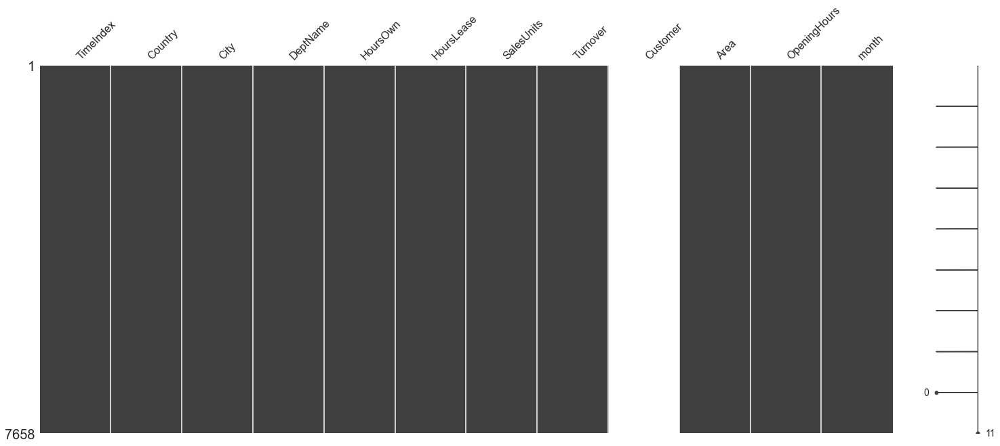

In [27]:
import missingno as msno
  
# Visualize missing values as a matrix
msno.matrix(df)

<AxesSubplot:>

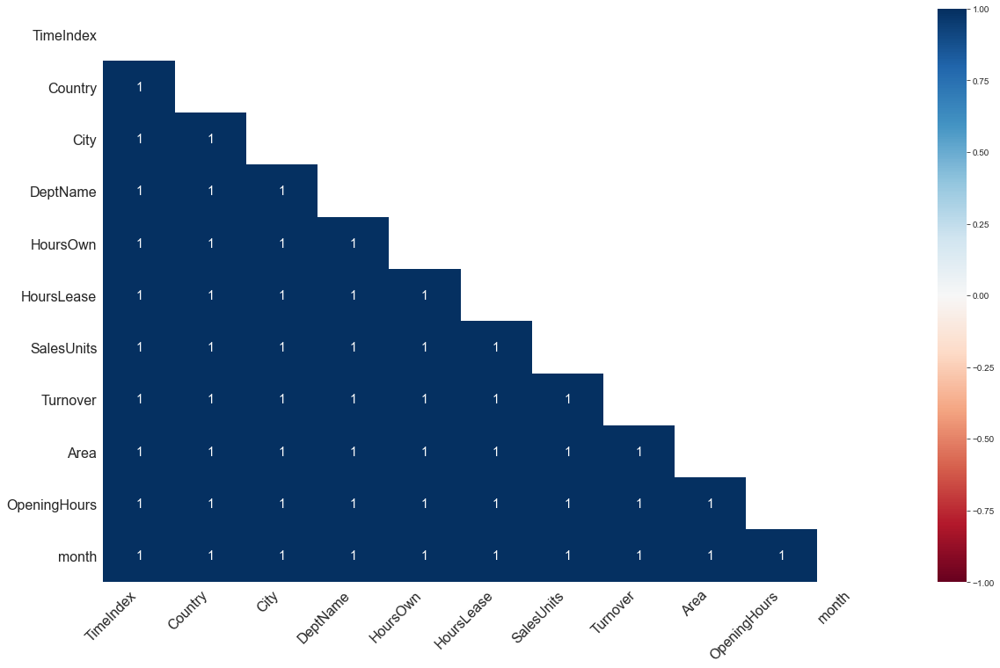

In [28]:
# Visualize the correlation between the number of
# missing values in different columns as a heatmap
msno.heatmap(df)

<AxesSubplot:>

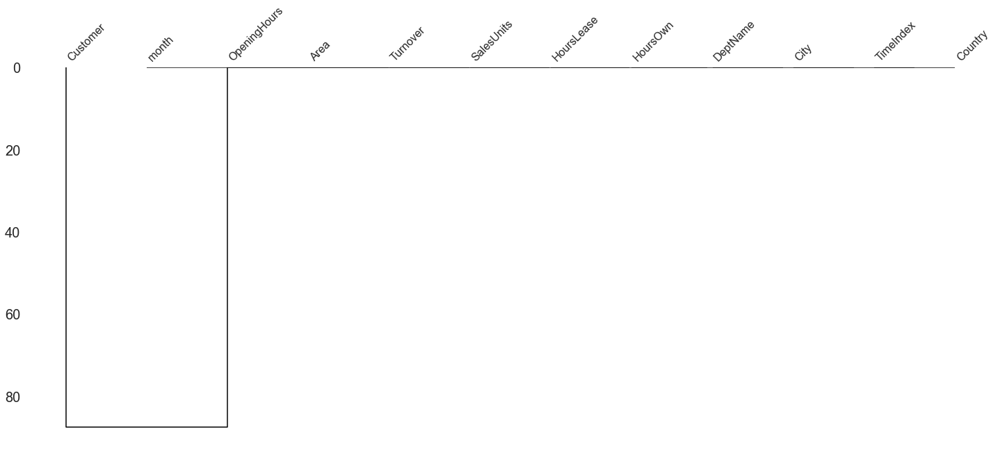

In [29]:
# Visualizing the hierarchical relationship
msno.dendrogram(df)

In [30]:
df.drop(['Customer'], axis=1, inplace=True)

In [31]:
con_vars = ['HoursOwn', 'HoursLease', 'SalesUnits', 'Turnover', 'Area']
cat_vars = ['TimeIndex', 'Country', 'City',
       'DeptName', 'OpeningHours', 'month']

In [32]:
df.describe()

,TimeIndex,HoursOwn,HoursLease,SalesUnits,Turnover,Area,month
count,7650.000000,7650.000000,7650.000000,7.650000e+03,7.650000e+03,7650.000000,7650.000000
mean,5.000000,7721.348494,22.036078,1.076471e+06,3.721393e+06,7557.276935,6.000000
std,2.582158,12320.707956,133.299513,1.728113e+06,6.003380e+06,10114.005970,3.829959
min,1.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,1.000000
25%,3.000000,1951.926750,0.000000,5.457125e+04,2.726798e+05,652.080000,3.000000
50%,5.000000,3508.905000,0.000000,2.932300e+05,9.319575e+05,3714.120000,5.000000
75%,7.000000,7430.067000,0.000000,9.175075e+05,3.264432e+06,8932.470000,10.000000
max,9.000000,93783.747000,3984.000000,1.124296e+07,4.271739e+07,40853.040000,12.000000


# Multiple Imputation of Missing Values

In [33]:
X = df[con_vars].values
X

array([[3.18476400e+03, 0.00000000e+00, 3.98560000e+05, 1.22624400e+06,
        9.53040000e+02],
       [1.58294100e+03, 0.00000000e+00, 8.27250000e+04, 3.87810000e+05,
        7.20480000e+02],
       [4.72050000e+01, 0.00000000e+00, 4.38400000e+05, 6.54657000e+05,
        9.66720000e+02],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        7.55727694e+03],
       [2.22492900e+03, 0.00000000e+00, 2.45000000e+02, 0.00000000e+00,
        7.55727694e+03],
       [3.96522000e+04, 0.00000000e+00, 3.88653000e+06, 1.50562140e+07,
        7.55727694e+03]])

In [34]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)

In [35]:
imp.fit(X)

IterativeImputer(random_state=0)

In [36]:
X = imp.transform(X)

In [37]:
df_con = pd.DataFrame(data=X, columns=con_vars)

In [38]:
df_con.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7658 entries, 0 to 7657
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   HoursOwn    7658 non-null   float64
 1   HoursLease  7658 non-null   float64
 2   SalesUnits  7658 non-null   float64
 3   Turnover    7658 non-null   float64
 4   Area        7658 non-null   float64
dtypes: float64(5)
memory usage: 299.3 KB


In [39]:
df_cat = df[cat_vars]
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7658 entries, 0 to 7657
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TimeIndex     7650 non-null   float64
 1   Country       7650 non-null   object 
 2   City          7650 non-null   object 
 3   DeptName      7650 non-null   object 
 4   OpeningHours  7650 non-null   object 
 5   month         7650 non-null   float64
dtypes: float64(2), object(4)
memory usage: 359.1+ KB


In [40]:
# from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder
import warnings
warnings.filterwarnings('ignore')

ordinal_enc_dict = {}
# encoder = preprocessing.OrdinalEncoder()

# Loop over columns to encode
for columns in cat_vars:
    ordinal_enc_dict[columns] = OrdinalEncoder()
    # Retains only non-null values
    nonulls = np.array(df_cat[columns].dropna())
    # Reshapes the data for encoding
    impute_reshape = nonulls.reshape(-1,1)
    # Encode data
    impute_ordinal = ordinal_enc_dict[columns].fit_transform(impute_reshape)
    # Assign back encoded values to non-null values
    df_cat[columns].loc[df_cat[columns].notnull()] = np.squeeze(impute_ordinal)
    


In [41]:
df_cat

,TimeIndex,Country,City,DeptName,OpeningHours,month
0,0.0,10,26,5,0,6.0
1,0.0,10,26,8,0,6.0
2,0.0,10,26,15,0,6.0
3,0.0,10,26,6,0,6.0
4,0.0,10,26,9,0,6.0
...,...,...,...,...,...,...
7653,8.0,8,20,1,0,5.0
7654,8.0,8,20,3,0,5.0
7655,8.0,8,20,4,0,5.0
7656,8.0,8,20,16,0,5.0


In [42]:
W = df_cat[cat_vars].values
W


array([[0.0, 10.0, 26.0, 5.0, 0.0, 6.0],
       [0.0, 10.0, 26.0, 8.0, 0.0, 6.0],
       [0.0, 10.0, 26.0, 15.0, 0.0, 6.0],
       ...,
       [8.0, 8.0, 20.0, 4.0, 0.0, 5.0],
       [8.0, 8.0, 20.0, 16.0, 0.0, 5.0],
       [8.0, 8.0, 20.0, 14.0, 0.0, 5.0]], dtype=object)

In [43]:
df_cat_imputed = df_cat.copy(deep=True)

In [44]:
df_cat_imputed.iloc[:, :] = np.round(imp.fit_transform(df_cat_imputed))

In [45]:
for col in df_cat_imputed:
    reshaped_col = df_cat_imputed[col].values.reshape(-1, 1)
    df_cat_imputed[col] = ordinal_enc_dict[col].inverse_transform(reshaped_col)

In [46]:
df_cat_imputed[cat_vars]

,TimeIndex,Country,City,DeptName,OpeningHours,month
0,1.0,United Kingdom,London (I),Dry,Type A,10.0
1,1.0,United Kingdom,London (I),Frozen,Type A,10.0
2,1.0,United Kingdom,London (I),other,Type A,10.0
3,1.0,United Kingdom,London (I),Fish,Type A,10.0
4,1.0,United Kingdom,London (I),Fruits & Vegetables,Type A,10.0
...,...,...,...,...,...,...
7653,9.0,Sweden,Gothenburg,Checkout,Type A,6.0
7654,9.0,Sweden,Gothenburg,Customer Services,Type A,6.0
7655,9.0,Sweden,Gothenburg,Delivery,Type A,6.0
7656,9.0,Sweden,Gothenburg,others,Type A,6.0


In [47]:
# df_cat_imputed = df_cat_imputed.astype(str)

In [48]:
df_cat_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7658 entries, 0 to 7657
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TimeIndex     7658 non-null   float64
 1   Country       7658 non-null   object 
 2   City          7658 non-null   object 
 3   DeptName      7658 non-null   object 
 4   OpeningHours  7658 non-null   object 
 5   month         7658 non-null   float64
dtypes: float64(2), object(4)
memory usage: 359.1+ KB


In [49]:
df = pd.concat([df_con, df_cat_imputed], axis=1)

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7658 entries, 0 to 7657
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   HoursOwn      7658 non-null   float64
 1   HoursLease    7658 non-null   float64
 2   SalesUnits    7658 non-null   float64
 3   Turnover      7658 non-null   float64
 4   Area          7658 non-null   float64
 5   TimeIndex     7658 non-null   float64
 6   Country       7658 non-null   object 
 7   City          7658 non-null   object 
 8   DeptName      7658 non-null   object 
 9   OpeningHours  7658 non-null   object 
 10  month         7658 non-null   float64
dtypes: float64(7), object(4)
memory usage: 658.2+ KB


In [51]:
df.isnull().sum()

HoursOwn        0
HoursLease      0
SalesUnits      0
Turnover        0
Area            0
TimeIndex       0
Country         0
City            0
DeptName        0
OpeningHours    0
month           0
dtype: int64

In [52]:
# Just a helper module to make visualizations more intuitive
num_to_month={1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'July', 8:'Aug',9:'Sept', 10:'Oct', 11:'Nov',12:'Dec'}
df.month=df.month.map(num_to_month)

In [53]:
df.head()

,HoursOwn,HoursLease,SalesUnits,Turnover,Area,TimeIndex,Country,City,DeptName,OpeningHours,month
0,3184.764,0.0,398560.0,1226244.0,953.04,1.0,United Kingdom,London (I),Dry,Type A,Oct
1,1582.941,0.0,82725.0,387810.0,720.48,1.0,United Kingdom,London (I),Frozen,Type A,Oct
2,47.205,0.0,438400.0,654657.0,966.72,1.0,United Kingdom,London (I),other,Type A,Oct
3,1623.852,0.0,309425.0,499434.0,1053.36,1.0,United Kingdom,London (I),Fish,Type A,Oct
4,1759.173,0.0,165515.0,329397.0,1053.36,1.0,United Kingdom,London (I),Fruits & Vegetables,Type A,Oct


In [54]:
#Let's Check if we have any duplicated row
df.duplicated().sum()

7

In [55]:
df = df.drop_duplicates()
df.duplicated().sum()

0

In [56]:
# df['HoursLease'].unique()

## VISUALIZE AND EXPLORE DATASET

# Visualizing the distribution of a continuous variable using distplot  with seaborn kdeplot()

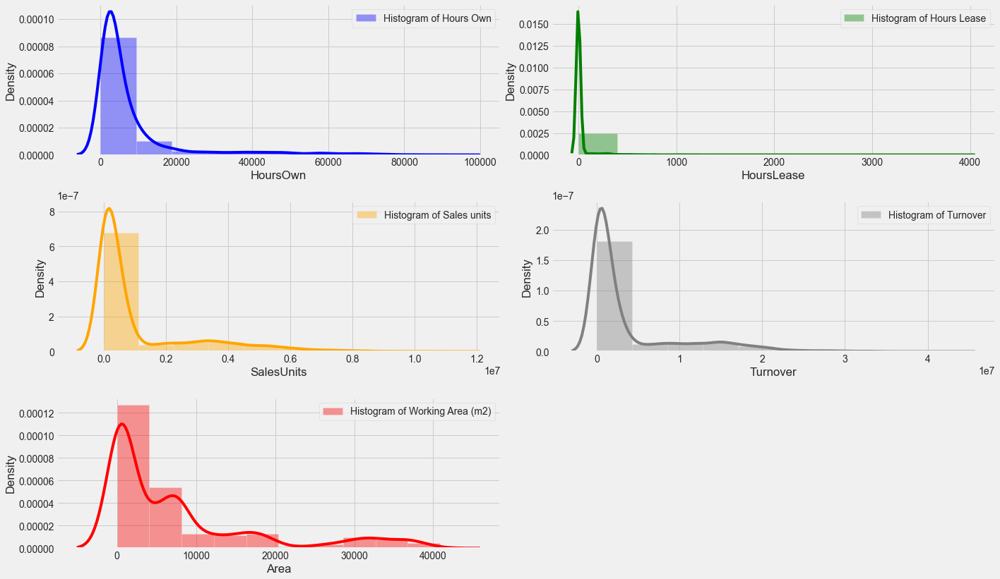

In [57]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(20,15))
plt.subplot(421)
sns.distplot(df['HoursOwn'], bins=10, color='blue', label='Histogram of Hours Own')
plt.legend(loc='best')
plt.subplot(422)
sns.distplot(df['HoursLease'], bins=10, color='green', label='Histogram of Hours Lease')
plt.legend(loc='best')
plt.subplot(423)
sns.distplot(df['SalesUnits'], bins=10, color='orange', label='Histogram of Sales units')
plt.legend(loc='best')
plt.subplot(424)
sns.distplot(df['Turnover'], bins=10, color='grey', label='Histogram of Turnover')
plt.legend(loc='best')
plt.subplot(425)
sns.distplot(df['Area'], bins=10, color='red', label='Histogram of Working Area (m2)')
plt.legend(loc='best')
plt.ticklabel_format(style = 'plain', axis = 'x', scilimits=(0,1))
plt.tight_layout()

In [58]:
Monthly_Sales_Unit = df.groupby(['Country','month']).agg({'SalesUnits':'sum'}).reset_index().rename(columns={'SalesUnits':'Sales_units_amounts'})
Monthly_Sales_Unit.head(10)

,Country,month,Sales_units_amounts
0,Belgium,Apr,67314545.0
1,Belgium,Dec,83569425.0
2,Belgium,Feb,56011385.0
3,Belgium,Jan,54595505.0
4,Belgium,Jun,61332745.0
5,Belgium,Mar,60013625.0
6,Belgium,May,62716065.0
7,Belgium,Nov,69973905.0
8,Belgium,Oct,60962325.0
9,Czech Republic,Apr,58295880.0


## What was the best month for sales? How much was earned that month?

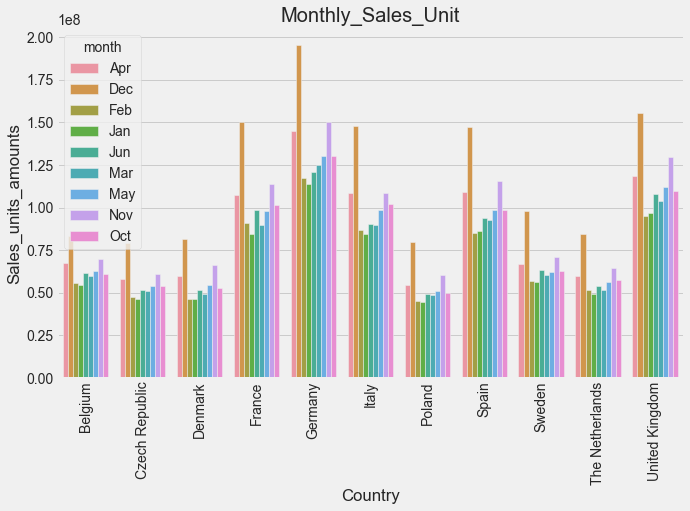

In [59]:
plt.figure(figsize=(10,6))
sns.barplot(data=Monthly_Sales_Unit, x='Country', y='Sales_units_amounts', hue='month')
plt.title('Monthly_Sales_Unit')
plt.xticks(rotation = 'vertical')
plt.show()

In [60]:
Monthly_Sales_Unit[Monthly_Sales_Unit['Country']=='Germany']

,Country,month,Sales_units_amounts
36,Germany,Apr,144653105.0
37,Germany,Dec,195579840.0
38,Germany,Feb,117354700.0
39,Germany,Jan,113847490.0
40,Germany,Jun,120808710.0
41,Germany,Mar,124889510.0
42,Germany,May,130196375.0
43,Germany,Nov,150064690.0
44,Germany,Oct,130518950.0


In [61]:
Monthly_Sales_Item = df.groupby(['DeptName','month']).agg({'SalesUnits':'sum'}).reset_index().rename(columns={'SalesUnits':'Sales_units_amounts'})
Monthly_Sales_Item.head(10)

,DeptName,month,Sales_units_amounts
0,Admin,Apr,6125.0
1,Admin,Dec,6125.0
2,Admin,Feb,6125.0
3,Admin,Jan,6125.0
4,Admin,Jun,6125.0
5,Admin,Mar,6125.0
6,Admin,May,6125.0
7,Admin,Nov,6125.0
8,Admin,Oct,6125.0
9,Checkout,Apr,235389580.0


## How much sales of each item was earned per month?

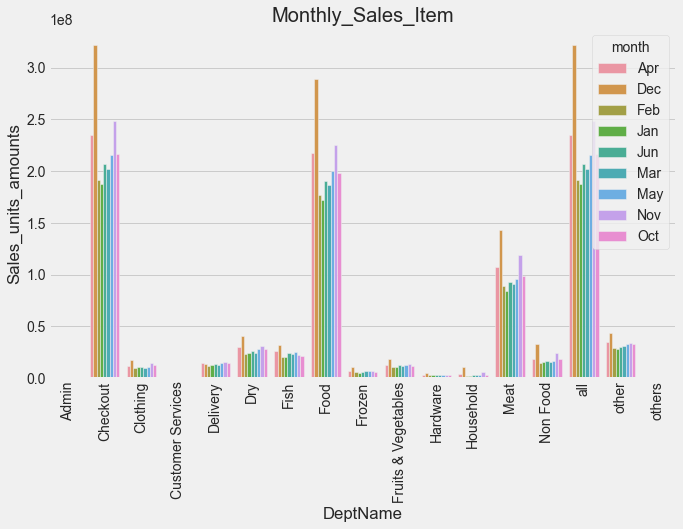

In [62]:
plt.figure(figsize=(10,6))
sns.barplot(data=Monthly_Sales_Item, x='DeptName', y='Sales_units_amounts', hue='month')
plt.title('Monthly_Sales_Item')
plt.xticks(rotation = 'vertical')
plt.show()

In [63]:
Monthly_Sales_Item[Monthly_Sales_Item['DeptName']=='Admin']

,DeptName,month,Sales_units_amounts
0,Admin,Apr,6125.0
1,Admin,Dec,6125.0
2,Admin,Feb,6125.0
3,Admin,Jan,6125.0
4,Admin,Jun,6125.0
5,Admin,Mar,6125.0
6,Admin,May,6125.0
7,Admin,Nov,6125.0
8,Admin,Oct,6125.0


In [64]:
Monthly_Sales_Item[Monthly_Sales_Item['DeptName']=='Checkout']

,DeptName,month,Sales_units_amounts
9,Checkout,Apr,235389580.0
10,Checkout,Dec,322297840.0
11,Checkout,Feb,191510160.0
12,Checkout,Jan,187652400.0
13,Checkout,Jun,207414380.0
14,Checkout,Mar,202308240.0
15,Checkout,May,215806595.0
16,Checkout,Nov,248931165.0
17,Checkout,Oct,216580740.0


In [65]:
Sales_Item_in_city = df.groupby(['City']).agg({'SalesUnits':'sum'}).reset_index().rename(columns={'SalesUnits':'Sales_units_in_citys'})
Sales_Item_in_city.head()

,City,Sales_units_in_citys
0,Aalborg (I),124750325.0
1,Aalborg (II),166811810.0
2,Amsterdam,124342600.0
3,Antwerp,225644730.0
4,Barcelona (I),155962745.0


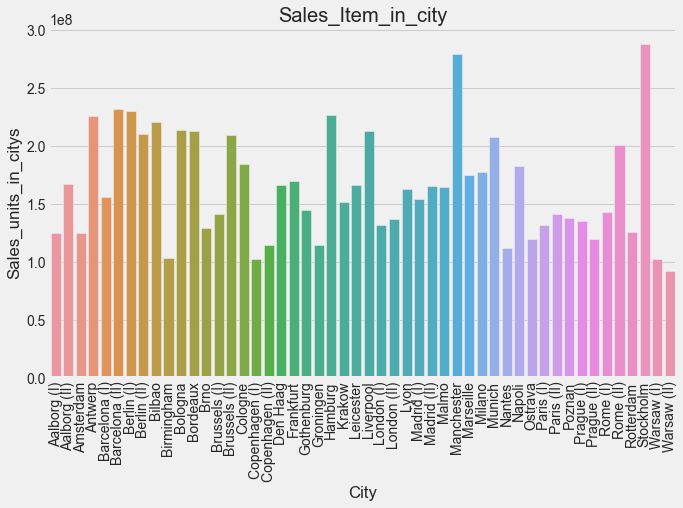

In [66]:
plt.figure(figsize=(10,6))
sns.barplot(data=Sales_Item_in_city, x='City', y='Sales_units_in_citys')
plt.title('Sales_Item_in_city')
plt.xticks(rotation = 'vertical')
plt.show()

# Visualizing the Scater Plot Density of a continuous variables 

In [67]:
con_vars = ['HoursOwn', 'HoursLease', 'SalesUnits', 'Turnover', 'Area']
df1 = df[con_vars]
df1 = pd.DataFrame(data=df1, columns= con_vars)

In [68]:
# Visualize the relationship between variables using scatter plots
import plotly.express as px
fig = px.scatter(df1, 
                x='HoursOwn', y='HoursLease', color='SalesUnits')# fill color by months
fig.update_layout(title_text='SalesUnits',
                  width=810,
                  height=510
                 )
fig.show()

In [69]:
# Visualize the relationship between variables using pairplots

fig = px.scatter_matrix(df1, 
                        dimensions=df1.columns[:], color='SalesUnits')# fill color by months
fig.update_layout(title_text='SalesUnits',
                  width=1100,
                  height=1100
                 )
fig.show()

# Outlier Detection Using Box Plot

In [70]:
# Draw a vertical boxplot grouped 
# by a categorical variable:
fig=px.box(df, x = 'DeptName', y = 'SalesUnits')
fig.update_layout(title_text='SalesUnits', width=910, height=610)
fig.show()

In [71]:
# Draw a vertical boxplot grouped 
# by a categorical variable:
fig=px.box(df, x = 'DeptName', y = 'HoursOwn')
fig.update_layout(title_text='HoursOwn', width=910, height=610)
fig.show()

In [72]:
# Draw a vertical boxplot grouped 
# by a categorical variable:
fig=px.box(df, x = 'DeptName', y = 'HoursLease')
fig.update_layout(title_text='HoursLease', width=910, height=610)
fig.show()

In [73]:
# Draw a vertical boxplot grouped 
# by a categorical variable:
fig=px.box(df, x = 'DeptName', y = 'Turnover')
fig.update_layout(title_text='Turnover', width=910, height=610)
fig.show()

In [74]:
# Draw a vertical boxplot grouped 
# by a categorical variable:
fig=px.box(df, x = 'DeptName', y = 'Area')
fig.update_layout(title_text='Area', width=910, height=610)
fig.show()

# Removing Outliers

In [75]:
# First we will calculate IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

HoursOwn      5.483648e+03
HoursLease    0.000000e+00
SalesUnits    8.635850e+05
Turnover      2.995257e+06
Area          8.279820e+03
TimeIndex     4.000000e+00
dtype: float64


In [76]:
#filter out the outliers by keeping only valid values
def remove_outlier_IQR(df):
    Q1=df.quantile(0.25)
    Q3=df.quantile(0.75)
    IQR=Q3-Q1
    df_final=df[~((df<(Q1-1.5*IQR)) | (df>(Q3+1.5*IQR)))]
    return df_final

In [77]:
df_outlier_removed=remove_outlier_IQR(df.HoursOwn)
df_outlier_removed=pd.DataFrame(df_outlier_removed)
ind_diff=df.index.difference(df_outlier_removed.index)

for i in range(0, len(ind_diff),1):
    df_final=df.drop([ind_diff[i]])
    df=df_final

In [78]:
df_outlier_removed=remove_outlier_IQR(df.HoursLease)
df_outlier_removed=pd.DataFrame(df_outlier_removed)
ind_diff=df.index.difference(df_outlier_removed.index)

for i in range(0, len(ind_diff),1):
    df_final=df.drop([ind_diff[i]])
    df=df_final

In [79]:
df_outlier_removed=remove_outlier_IQR(df.SalesUnits)
df_outlier_removed=pd.DataFrame(df_outlier_removed)
ind_diff=df.index.difference(df_outlier_removed.index)

for i in range(0, len(ind_diff),1):
    df_final=df.drop([ind_diff[i]])
    df=df_final

In [80]:
df_outlier_removed=remove_outlier_IQR(df.Turnover)
df_outlier_removed=pd.DataFrame(df_outlier_removed)
ind_diff=df.index.difference(df_outlier_removed.index)

for i in range(0, len(ind_diff),1):
    df_final=df.drop([ind_diff[i]])
    df=df_final

In [81]:
df_outlier_removed=remove_outlier_IQR(df.Area)
df_outlier_removed=pd.DataFrame(df_outlier_removed)
ind_diff=df.index.difference(df_outlier_removed.index)

for i in range(0, len(ind_diff),1):
    df_final=df.drop([ind_diff[i]])
    df=df_final
df.reset_index(drop=True, inplace=True)

In [82]:
df.shape

(5246, 11)

In [83]:
df.head()

,HoursOwn,HoursLease,SalesUnits,Turnover,Area,TimeIndex,Country,City,DeptName,OpeningHours,month
0,3184.764,0.0,398560.0,1226244.0,953.04,1.0,United Kingdom,London (I),Dry,Type A,Oct
1,1582.941,0.0,82725.0,387810.0,720.48,1.0,United Kingdom,London (I),Frozen,Type A,Oct
2,47.205,0.0,438400.0,654657.0,966.72,1.0,United Kingdom,London (I),other,Type A,Oct
3,1623.852,0.0,309425.0,499434.0,1053.36,1.0,United Kingdom,London (I),Fish,Type A,Oct
4,1759.173,0.0,165515.0,329397.0,1053.36,1.0,United Kingdom,London (I),Fruits & Vegetables,Type A,Oct


# correlation between numeric features

In [84]:
corr = df[con_vars].corr()
corr

,HoursOwn,HoursLease,SalesUnits,Turnover,Area
HoursOwn,1.000000,NaN,0.016618,0.405523,0.226008
HoursLease,NaN,NaN,NaN,NaN,NaN
SalesUnits,0.016618,NaN,1.000000,0.696206,0.014229
Turnover,0.405523,NaN,0.696206,1.000000,0.319862
Area,0.226008,NaN,0.014229,0.319862,1.000000


In [85]:
df.isnull().sum()

HoursOwn        0
HoursLease      0
SalesUnits      0
Turnover        0
Area            0
TimeIndex       0
Country         0
City            0
DeptName        0
OpeningHours    0
month           0
dtype: int64

<AxesSubplot:>

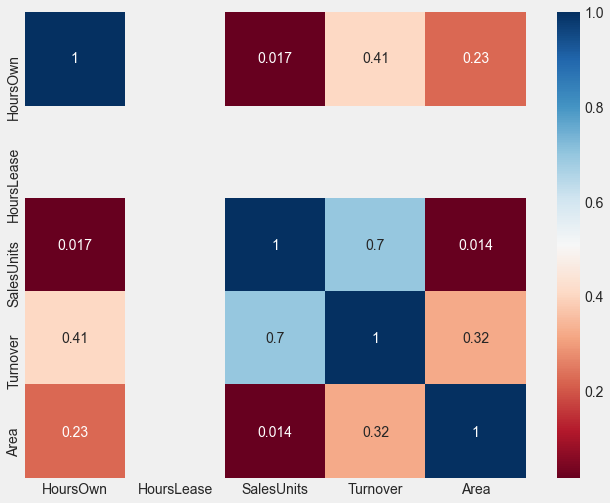

In [86]:
#Let's investigate correlation between each values
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='RdBu')

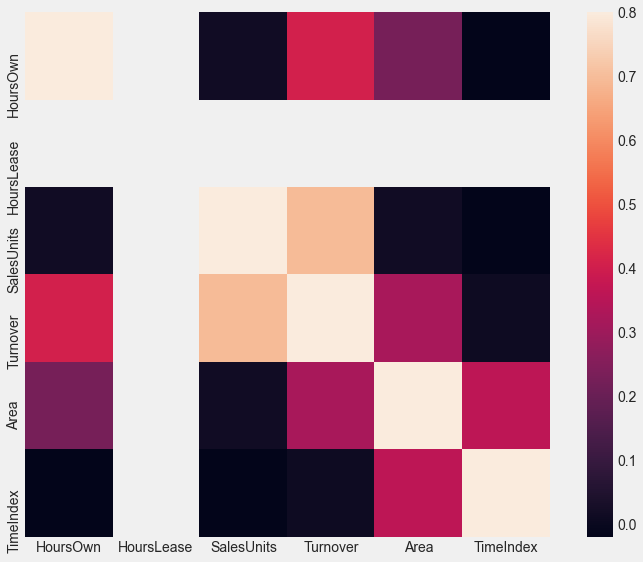

In [87]:
#Correlation matrix (heatmap style)
#correlation matrix
corrmat = df.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);


In [88]:
print(corr['SalesUnits'].sort_values(ascending=False))

SalesUnits    1.000000
Turnover      0.696206
HoursOwn      0.016618
Area          0.014229
HoursLease         NaN
Name: SalesUnits, dtype: float64


In [89]:
df['HoursLease'].unique()

array([0.])

In [90]:
df.drop(['HoursLease'], axis=1, inplace=True)
con_vars.remove('HoursLease')

# Enconding Categorical Variables

In [91]:
df.columns

Index(['HoursOwn', 'SalesUnits', 'Turnover', 'Area', 'TimeIndex', 'Country',
       'City', 'DeptName', 'OpeningHours', 'month'],
      dtype='object')

In [92]:
# Convert categorical variables to string
cat_vars = ['TimeIndex', 'Country', 'City',
       'DeptName', 'OpeningHours', 'month']
df[cat_vars] = df[cat_vars].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5246 entries, 0 to 5245
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   HoursOwn      5246 non-null   float64
 1   SalesUnits    5246 non-null   float64
 2   Turnover      5246 non-null   float64
 3   Area          5246 non-null   float64
 4   TimeIndex     5246 non-null   object 
 5   Country       5246 non-null   object 
 6   City          5246 non-null   object 
 7   DeptName      5246 non-null   object 
 8   OpeningHours  5246 non-null   object 
 9   month         5246 non-null   object 
dtypes: float64(4), object(6)
memory usage: 410.0+ KB


# Checking unique features and data pattern for categorical variables

In [93]:
df[cat_vars].describe(include=['O'])

,TimeIndex,Country,City,DeptName,OpeningHours,month
count,5246,5246,5246,5246,5246,5246
unique,9,11,50,14,3,9
top,9.0,Germany,Warsaw (I),Household,Type A,Jun
freq,627,626,122,450,3929,627


In [94]:
# One hot encoding - to convert categorical data to continuous
# df[cat_vars] = df[cat_vars].astype(str)
df2 = pd.get_dummies(df)
df2.head(5)

,HoursOwn,SalesUnits,Turnover,Area,TimeIndex_1.0,TimeIndex_2.0,TimeIndex_3.0,TimeIndex_4.0,TimeIndex_5.0,TimeIndex_6.0,...,OpeningHours_Type C,month_Apr,month_Dec,month_Feb,month_Jan,month_Jun,month_Mar,month_May,month_Nov,month_Oct
0,3184.764,398560.0,1226244.0,953.04,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,1582.941,82725.0,387810.0,720.48,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,47.205,438400.0,654657.0,966.72,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,1623.852,309425.0,499434.0,1053.36,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,1759.173,165515.0,329397.0,1053.36,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


# RobustScaler Normalization

In [95]:
# Normalizing
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
df2[con_vars]=scaler.fit_transform(df2[con_vars])
df2.head(5)

,HoursOwn,SalesUnits,Turnover,Area,TimeIndex_1.0,TimeIndex_2.0,TimeIndex_3.0,TimeIndex_4.0,TimeIndex_5.0,TimeIndex_6.0,...,OpeningHours_Type C,month_Apr,month_Dec,month_Feb,month_Jan,month_Jun,month_Mar,month_May,month_Nov,month_Oct
0,0.299553,0.701547,0.618972,-0.006268,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,-0.399863,-0.153378,-0.110166,-0.055448,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,-1.070423,0.809389,0.121896,-0.003375,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,-0.381999,0.460270,-0.013093,0.014947,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,-0.322913,0.070724,-0.160964,0.014947,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


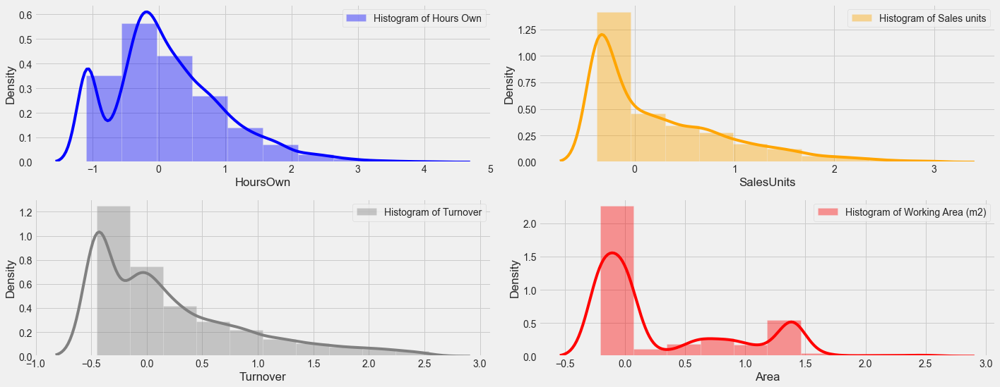

In [96]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(20,15))
plt.subplot(421)
sns.distplot(df2['HoursOwn'], bins=10, color='blue', label='Histogram of Hours Own')
plt.legend(loc='best')
plt.subplot(422)
sns.distplot(df2['SalesUnits'], bins=10, color='orange', label='Histogram of Sales units')
plt.legend(loc='best')
plt.subplot(423)
sns.distplot(df2['Turnover'], bins=10, color='grey', label='Histogram of Turnover')
plt.legend(loc='best')
plt.subplot(424)
sns.distplot(df2['Area'], bins=10, color='red', label='Histogram of Working Area (m2)')
plt.legend(loc='best')
plt.ticklabel_format(style = 'plain', axis = 'x', scilimits=(0,1))
plt.tight_layout()

In [97]:
df3 = df2[con_vars]
df3 = pd.DataFrame(data=df3, columns= con_vars)

In [98]:
# Visualize the relationship between variables using pairplots
import plotly.express as px
fig = px.scatter(df3, 
                x='SalesUnits', y='Turnover', color='SalesUnits')# fill color by months
fig.update_layout(title_text='SalesUnits',
                  width=810,
                  height=510
                 )
fig.show()

In [99]:
# Visualize the relationship between variables using pairplots

fig = px.scatter_matrix(df3, 
                        dimensions=df3.columns[:], color='SalesUnits')# fill color by months
fig.update_layout(title_text='SalesUnits',
                  width=1100,
                  height=1100
                 )
fig.show()

In [100]:
df3['DeptName'] = df['DeptName']


In [101]:
# Draw a vertical boxplot grouped 
# by a categorical variable:
fig=px.box(df3, x = 'DeptName', y = 'SalesUnits')
fig.update_layout(title_text='SalesUnits', width=910, height=610)
fig.show()

fig=px.box(df3, x = 'DeptName', y = 'HoursOwn')
fig.update_layout(title_text='HoursOwn', width=910, height=610)
fig.show()

fig=px.box(df3, x = 'DeptName', y = 'Turnover')
fig.update_layout(title_text='Turnover', width=910, height=610)
fig.show()

fig=px.box(df3, x = 'DeptName', y = 'Area')
fig.update_layout(title_text='Area', width=910, height=610)
fig.show()

In [102]:
corr = df3.corr()
corr

,HoursOwn,SalesUnits,Turnover,Area
HoursOwn,1.000000,0.016618,0.405523,0.226008
SalesUnits,0.016618,1.000000,0.696206,0.014229
Turnover,0.405523,0.696206,1.000000,0.319862
Area,0.226008,0.014229,0.319862,1.000000


<AxesSubplot:>

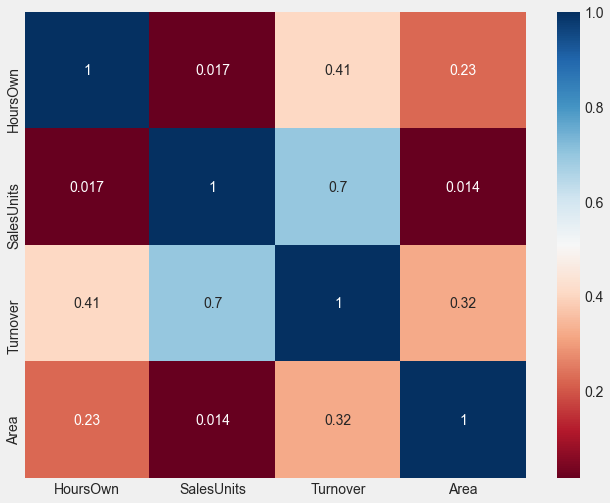

In [103]:
#Let's investigate correlation between each values
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='RdBu')

<AxesSubplot:>

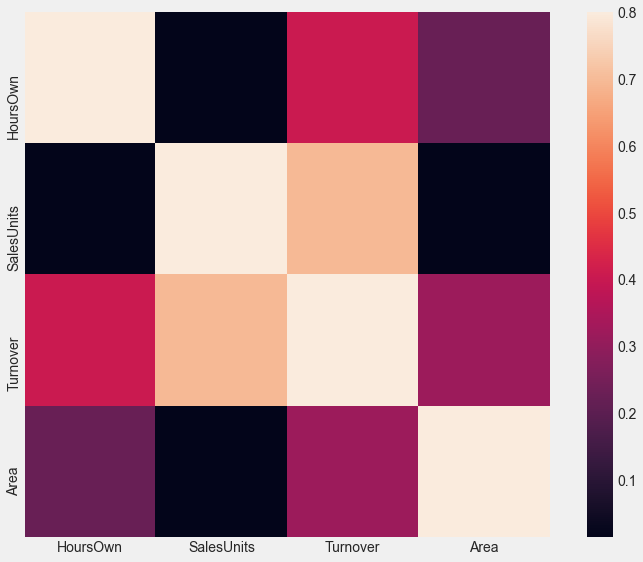

In [104]:
#Correlation matrix (heatmap style)
#correlation matrix
corrmat = df3.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True)

In [105]:
print(corr['SalesUnits'].sort_values(ascending=False))

SalesUnits    1.000000
Turnover      0.696206
HoursOwn      0.016618
Area          0.014229
Name: SalesUnits, dtype: float64


Text(0.5, 1.0, 'Features Correlating with Sales units')

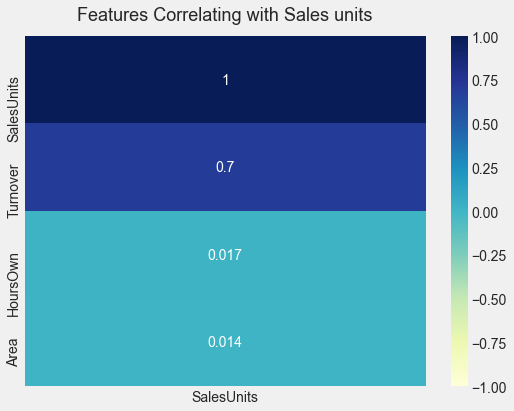

In [106]:
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(df3.corr()[['SalesUnits']].sort_values(by='SalesUnits', ascending=False), vmin=-1, vmax=1, annot=True, cmap='YlGnBu')
heatmap.set_title('Features Correlating with Sales units', fontdict={'fontsize':18}, pad=16)

# **Autoencoder**

In [107]:
# Define the final test sets
y = df2.SalesUnits


df4 = df2.drop(['SalesUnits'], axis = 1)

In [108]:
# Choose size of our encoded representations (we will reduce our initial features to this number)
encoding_dim = 28

# Define input layer
input_data = Input(shape=(df4.shape[1],))

In [109]:
# Encoder Layers
encoded1 = Dense(2000, activation = 'relu')(input_data)
encoded2 = Dense(1000, activation = 'relu')(encoded1)

encoded3 = Dense(encoding_dim, activation = 'relu')(encoded2)

# Decoder Layers
decoded3 = Dense(1000, activation = 'relu')(encoded3)
decoded2 = Dense(2000, activation = 'relu')(decoded3)
decoded1 = Dense(df4.shape[1], activation = 'relu')(decoded2)

In [110]:
# Create the autoencoder model
autoencoder = Model(input_data, decoded1)

In [111]:
#Compile the autoencoder model
autoencoder.compile(optimizer='adam',
                    loss='mse')

In [112]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 99)]              0         
_________________________________________________________________
dense (Dense)                (None, 2000)              200000    
_________________________________________________________________
dense_1 (Dense)              (None, 1000)              2001000   
_________________________________________________________________
dense_2 (Dense)              (None, 28)                28028     
_________________________________________________________________
dense_3 (Dense)              (None, 1000)              29000     
_________________________________________________________________
dense_4 (Dense)              (None, 2000)              2002000   
_________________________________________________________________
dense_5 (Dense)              (None, 99)                198099

In [113]:
#Fit to train set, validate with dev set and save to hist_auto for plotting purposes
hist_auto = autoencoder.fit(df4, df4,
                epochs=10,
                batch_size=512)

Epoch 1/10
11/11 [==============================] - 6s 324ms/step - loss: 0.0708
Epoch 2/10
11/11 [==============================] - 4s 338ms/step - loss: 0.0503
Epoch 3/10
11/11 [==============================] - 3s 309ms/step - loss: 0.0331
Epoch 4/10
11/11 [==============================] - 3s 280ms/step - loss: 0.0227
Epoch 5/10
11/11 [==============================] - 3s 279ms/step - loss: 0.0181
Epoch 6/10
11/11 [==============================] - 3s 275ms/step - loss: 0.0157
Epoch 7/10
11/11 [==============================] - 3s 293ms/step - loss: 0.0141
Epoch 8/10
11/11 [==============================] - 3s 266ms/step - loss: 0.0132
Epoch 9/10
11/11 [==============================] - 3s 275ms/step - loss: 0.0126
Epoch 10/10
11/11 [==============================] - 3s 270ms/step - loss: 0.0122


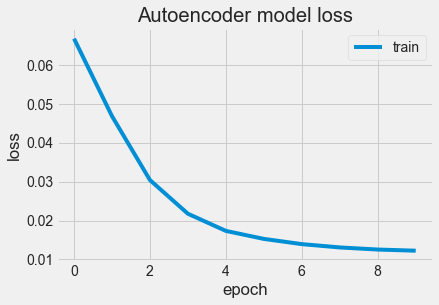

In [114]:
# Summarize history for loss
plt.figure()
plt.plot(hist_auto.history['loss'])
plt.title('Autoencoder model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# **Dimensinality** **Reduction**

In [115]:
# Create a separate model (encoder) in order to make encodings (first part of the autoencoder model)
encoder = Model(input_data, encoded3)

In [116]:
#Encode data set from above using the encoder
encoded_df4 = pd.DataFrame(encoder.predict(df4))
encoded_df4= encoded_df4.add_prefix('feature_')

In [117]:
print(encoded_df4.shape)
encoded_df4.head()

(5246, 28)


,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27
0,0.068549,1.826573,2.246309,0.921650,1.234924,1.032677,1.276534,1.044430,0.806833,1.829961,...,2.690553,2.082808,0.543871,0.577014,0.920624,0.579020,0.295482,1.096416,0.974338,1.636082
1,0.138559,1.812023,1.843754,1.660852,1.237447,0.320883,0.505958,1.357759,0.841527,1.900470,...,2.695007,2.163143,0.000000,0.504511,0.645665,1.012096,0.825927,0.777759,0.802744,1.412425
2,0.067690,1.926040,1.786081,1.498760,1.654827,0.068843,0.934653,1.064249,0.433184,1.881315,...,2.875995,1.320372,0.298557,1.137952,0.632925,1.040121,0.816597,0.261231,0.469508,1.282721
3,0.078143,1.764214,1.846740,0.582664,1.760396,0.870664,1.712047,1.279570,1.441056,1.711687,...,2.931269,1.314976,0.305999,0.924522,1.295668,0.541627,0.738410,0.563953,0.112080,1.085756
4,0.106240,1.324446,1.467365,0.821342,1.467715,0.720832,0.744415,1.217039,1.361744,1.774871,...,3.056673,1.613320,0.195107,0.944266,0.859719,1.168379,0.715456,1.179668,0.506470,1.094357


In [118]:
corr = encoded_df4.corr()
corr

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27
feature_0,1.000000,-0.020708,-0.020510,-0.154734,-0.164681,0.105228,-0.082353,-0.134394,-0.113059,0.071776,...,-0.030215,0.011775,0.205016,-0.062538,0.186418,0.064313,0.098489,0.036513,0.047363,-0.012837
feature_1,-0.020708,1.000000,-0.000070,-0.100337,-0.029242,0.036364,-0.183889,0.048270,-0.058646,-0.035204,...,-0.000716,-0.129893,-0.145798,-0.134247,-0.001124,-0.224460,-0.079310,-0.051404,-0.066997,0.059572
feature_2,-0.020510,-0.000070,1.000000,-0.010689,0.154115,0.124077,-0.038106,-0.057573,0.044697,0.130520,...,-0.054915,0.076511,0.134237,-0.082952,-0.036620,-0.271084,0.086091,-0.092189,0.377448,-0.058289
feature_3,-0.154734,-0.100337,-0.010689,1.000000,0.112111,0.007248,-0.099437,0.061178,-0.227482,-0.101242,...,-0.169067,-0.116281,0.114849,-0.144284,-0.055843,-0.055734,-0.247722,-0.090736,0.148760,0.030549
feature_4,-0.164681,-0.029242,0.154115,0.112111,1.000000,0.100973,-0.080248,0.032655,-0.031663,-0.047968,...,-0.172742,-0.317029,0.055132,0.020314,-0.101633,-0.485445,-0.072060,-0.060893,0.041338,0.036625
feature_5,0.105228,0.036364,0.124077,0.007248,0.100973,1.000000,-0.049982,0.334161,0.062415,0.086966,...,-0.058856,0.305736,0.300718,-0.034203,0.018421,-0.417560,-0.169088,0.120811,0.299775,-0.089690
feature_6,-0.082353,-0.183889,-0.038106,-0.099437,-0.080248,-0.049982,1.000000,-0.049629,-0.080516,-0.046177,...,-0.159634,0.041429,0.393634,-0.079262,0.013400,-0.022780,-0.070316,0.007931,-0.193988,-0.081929
feature_7,-0.134394,0.048270,-0.057573,0.061178,0.032655,0.334161,-0.049629,1.000000,0.055447,-0.015099,...,0.007089,0.029104,0.043089,-0.079469,-0.076166,0.031987,0.081957,-0.058633,0.065257,-0.075681
feature_8,-0.113059,-0.058646,0.044697,-0.227482,-0.031663,0.062415,-0.080516,0.055447,1.000000,0.020082,...,-0.016583,-0.030524,-0.194159,0.228290,0.115740,0.127613,-0.078828,-0.103530,-0.034404,0.068833
feature_9,0.071776,-0.035204,0.130520,-0.101242,-0.047968,0.086966,-0.046177,-0.015099,0.020082,1.000000,...,0.041445,0.075997,-0.095520,0.018824,-0.164779,0.077008,-0.023456,0.063551,0.142043,0.003479


<AxesSubplot:>

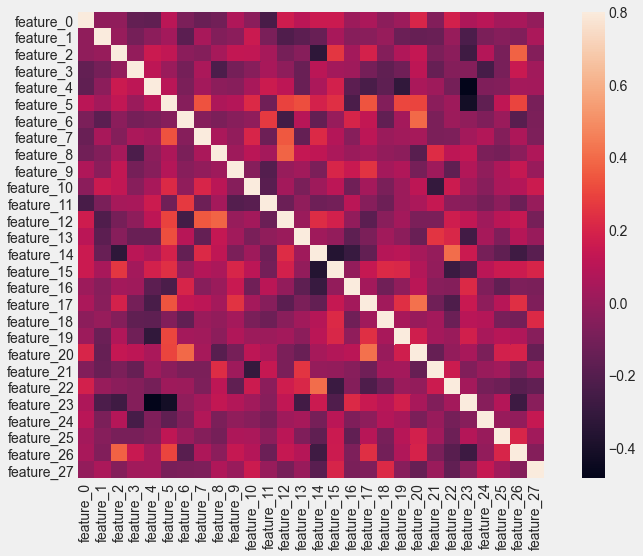

In [119]:
#Correlation matrix (heatmap style)
#correlation matrix
corrmat = encoded_df4.corr()
f, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(corrmat, vmax=.8, square=True)

In [120]:
encoded_df4['SalesUnits'] = y

In [121]:
encoded_df4.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,SalesUnits
0,0.068549,1.826573,2.246309,0.921650,1.234924,1.032677,1.276534,1.044430,0.806833,1.829961,...,2.082808,0.543871,0.577014,0.920624,0.579020,0.295482,1.096416,0.974338,1.636082,0.701547
1,0.138559,1.812023,1.843754,1.660852,1.237447,0.320883,0.505958,1.357759,0.841527,1.900470,...,2.163143,0.000000,0.504511,0.645665,1.012096,0.825927,0.777759,0.802744,1.412425,-0.153378
2,0.067690,1.926040,1.786081,1.498760,1.654827,0.068843,0.934653,1.064249,0.433184,1.881315,...,1.320372,0.298557,1.137952,0.632925,1.040121,0.816597,0.261231,0.469508,1.282721,0.809389
3,0.078143,1.764214,1.846740,0.582664,1.760396,0.870664,1.712047,1.279570,1.441056,1.711687,...,1.314976,0.305999,0.924522,1.295668,0.541627,0.738410,0.563953,0.112080,1.085756,0.460270
4,0.106240,1.324446,1.467365,0.821342,1.467715,0.720832,0.744415,1.217039,1.361744,1.774871,...,1.613320,0.195107,0.944266,0.859719,1.168379,0.715456,1.179668,0.506470,1.094357,0.070724


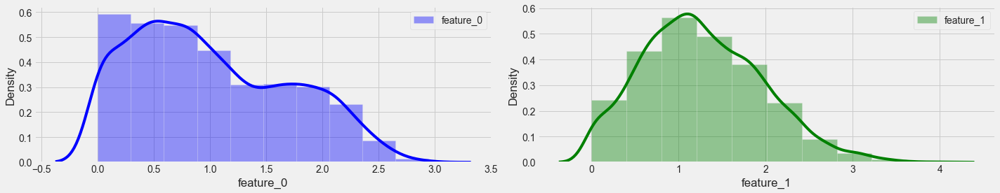

In [122]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(20,15))
plt.subplot(421)
sns.distplot(encoded_df4['feature_0'], bins=10, color='blue', label='feature_0')
plt.legend(loc='best')
plt.subplot(422)
sns.distplot(encoded_df4['feature_1'], bins=10, color='green', label='feature_1')
plt.legend(loc='best')
plt.ticklabel_format(style = 'plain', axis = 'x', scilimits=(0,1))
plt.tight_layout();

In [123]:
# Visualize the relationship between variables using pairplots
import plotly.express as px

fig = px.scatter(encoded_df4, 
                x='feature_0', y='feature_1', color='SalesUnits')# fill color by months
fig.update_layout(title_text='SalesUnits',
                  width=810,
                  height=510
                 )
fig.show()

In [124]:
encoded_df4['DeptName'] = df['DeptName']

In [125]:
# Draw a vertical boxplot grouped 
# by a categorical variable:
fig=px.box(encoded_df4, x= 'DeptName', y = 'feature_0')
fig.update_layout(title_text='feature_0', width=910, height=610)
fig.show()

fig=px.box(encoded_df4, x= 'DeptName', y = 'feature_1')
fig.update_layout(title_text='feature_1', width=910, height=610)
fig.show()

In [126]:
encoded_df4 = encoded_df4.drop(['DeptName'], axis=1)
corr = encoded_df4.corr()
print(corr['SalesUnits'].sort_values(ascending=False))

SalesUnits    1.000000
feature_17    0.398032
feature_20    0.394711
feature_6     0.370558
feature_2     0.333458
feature_26    0.221380
feature_16    0.214601
feature_25    0.146111
feature_15    0.134234
feature_11    0.112197
feature_9     0.104462
feature_10    0.096473
feature_3     0.092777
feature_1     0.086661
feature_27    0.026289
feature_4     0.025145
feature_0    -0.021628
feature_19   -0.056932
feature_23   -0.058011
feature_24   -0.079670
feature_5    -0.086616
feature_22   -0.135157
feature_13   -0.158600
feature_18   -0.167807
feature_21   -0.181676
feature_8    -0.281201
feature_7    -0.358688
feature_12   -0.461966
feature_14   -0.495881
Name: SalesUnits, dtype: float64


Text(0.5, 1.0, 'Features Correlating with Sales units')

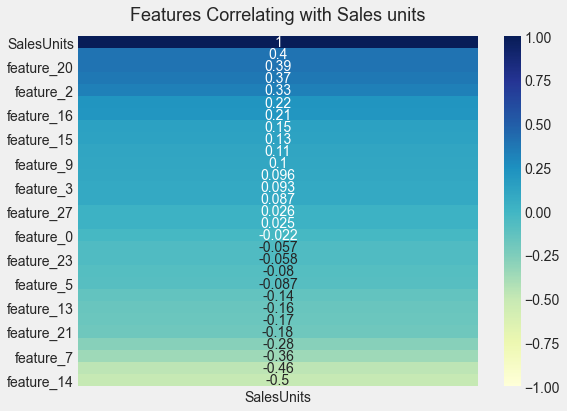

In [127]:
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(encoded_df4.corr()[['SalesUnits']].sort_values(by='SalesUnits', ascending=False), vmin=-1, vmax=1, annot=True, cmap='YlGnBu')
heatmap.set_title('Features Correlating with Sales units', fontdict={'fontsize':18}, pad=16)

# Splitting the data-set into Training and Test Set

In [128]:
#Split in 80% train and 20% test set

train, test = train_test_split(encoded_df4, test_size = 0.2, random_state= 1984)

In [129]:
# Define the final train and test sets
y_train = train.SalesUnits
y_test = test.SalesUnits

x_train = train.drop(['SalesUnits'], axis = 1)
x_test = test.drop(['SalesUnits'], axis = 1)

In [130]:
x_train =np.array(x_train)
x_test = np.array(x_test)

y_train = np.array(y_train)
y_test = np.array(y_test)

# XGBoost Model

In [131]:
# create an xgboost regression model
import xgboost as xgb

model = xgb.XGBRegressor()

# Model Training

In [132]:
model.fit(x_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

# Model prediction

In [133]:
y_pred = model.predict(x_test)

# Evaluating the result

# R-Squared

In [134]:
from sklearn.metrics import r2_score

In [135]:
r2_score(y_test, y_pred)

0.8606892273607702

# Root Mean Squared Error

In [136]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test, y_pred, squared=False)

0.2421707673881805